# Classification Intuition
You may have heard that XOR is not a "linearly seperable function" when learning about neural networks and classification. When a neural network performs classification, its essentially trying to "separate" the input space into regions it can confidently label as one class or another. So let's get some inuition on that using a 2D input space.

In [1]:
import pandas as pd
%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import numpy as np
import itertools
import seaborn as sns
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import clear_output
from mpl_toolkits.mplot3d import Axes3D

In [2]:
x = np.arange(-100,100)
y = np.arange(-100,100)
xy = list(itertools.product(x, y))

In [3]:
df = pd.DataFrame()
df["xy"] = xy
df["x"] = df["xy"].apply(lambda x: x[0])
df["y"] = df["xy"].apply(lambda x: x[1])
df["distance"] = df["xy"].apply(np.linalg.norm)

In [4]:
max_distance = df["distance"].abs().max()
max_coord = df["x"].abs().max()
df["RGBA"] = df.apply(lambda row: 
                      (0,
                       abs(row["x"])/max_coord, 
                       abs(row["y"])/max_coord,  
                       row["distance"]/max_distance) , axis=1)

<IPython.core.display.Javascript object>


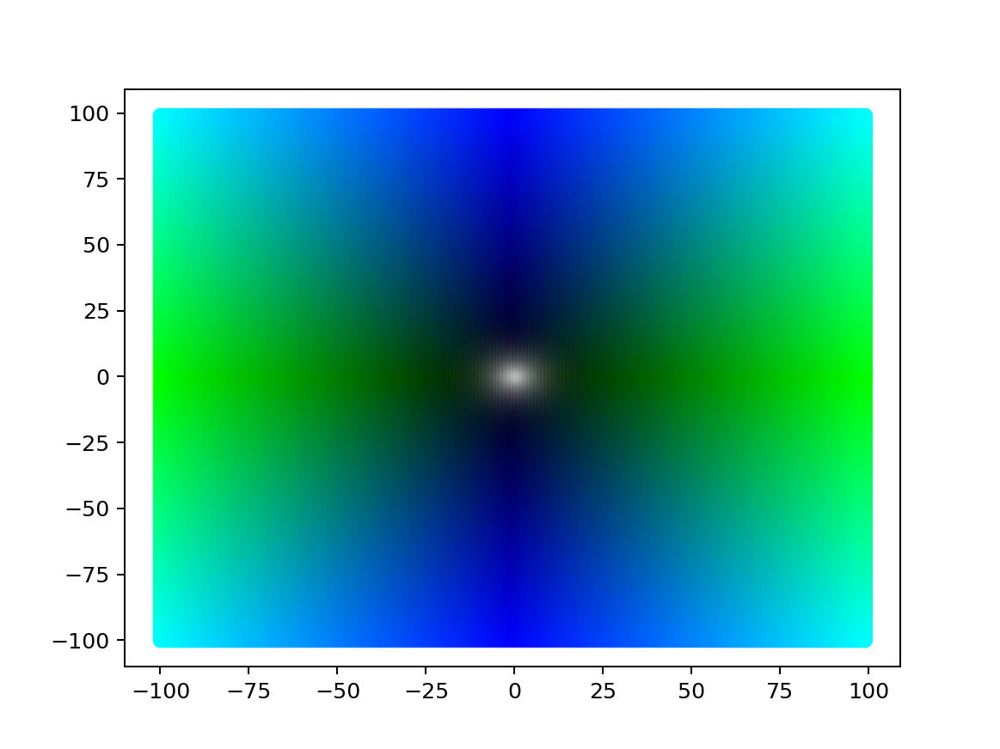

In [5]:
plt.scatter(df["x"], df["y"], c=df["RGBA"])

### Linear Transformations

<IPython.core.display.Javascript object>


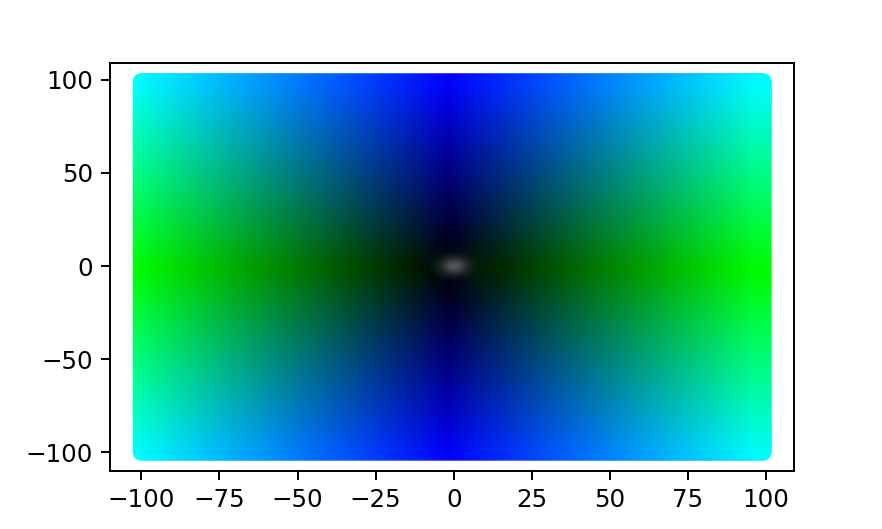

<IPython.core.display.Javascript object>


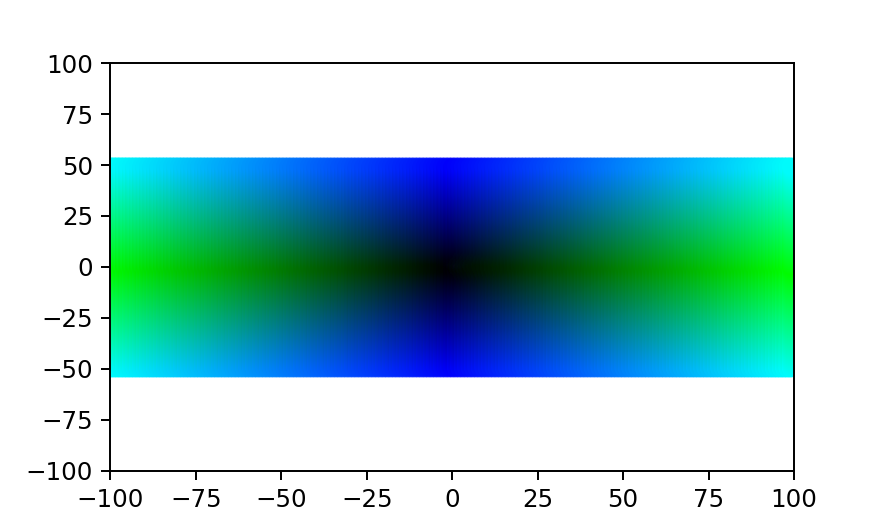

<IPython.core.display.Javascript object>


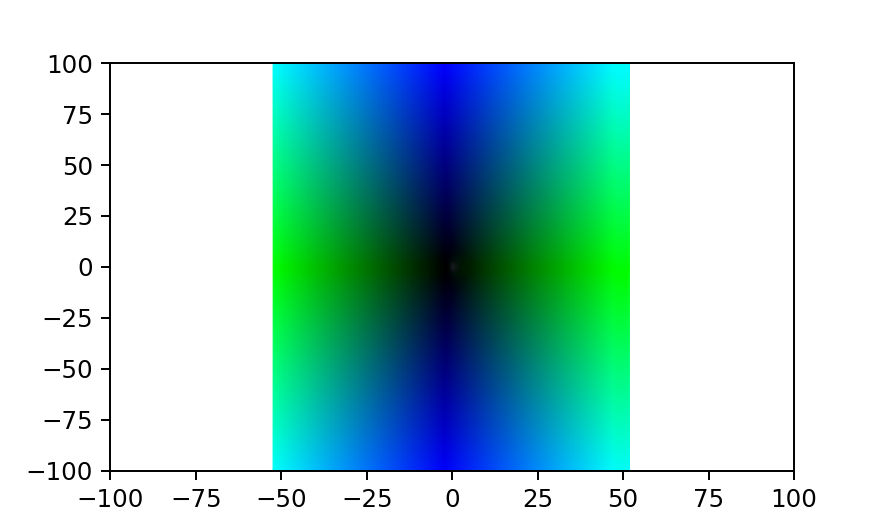

<IPython.core.display.Javascript object>


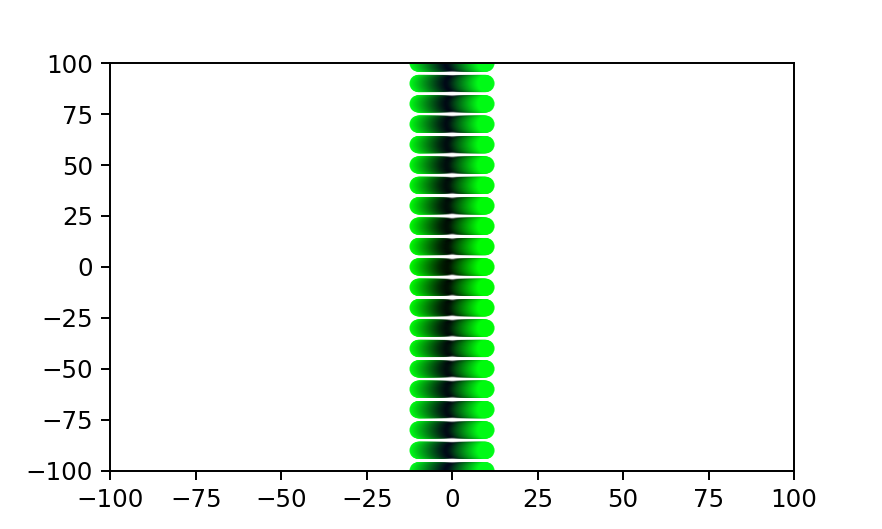

In [7]:
plt.figure(figsize=(5,3))
plt.scatter(df["x"], df["y"], c=df["RGBA"])

def f(Ax, Ay):
    df["x_skewed"] = df["x"].apply(lambda x: x*Ax)
    df["y_skewed"] = df["y"].apply(lambda x: x*Ay)
    plt.figure(figsize=(5,3))
    plt.scatter(df["x_skewed"], df["y_skewed"], c=df["RGBA"])
    plt.xlim(-100, 100)
    plt.ylim(-100, 100)
    
# interact(f, x_skew=1, y_skew=1)
f(Ax=1, Ay=0.5)
f(Ax=0.5, Ay=1)
f(Ax=0.1, Ay=10)

### Sigmoid


<IPython.core.display.Javascript object>


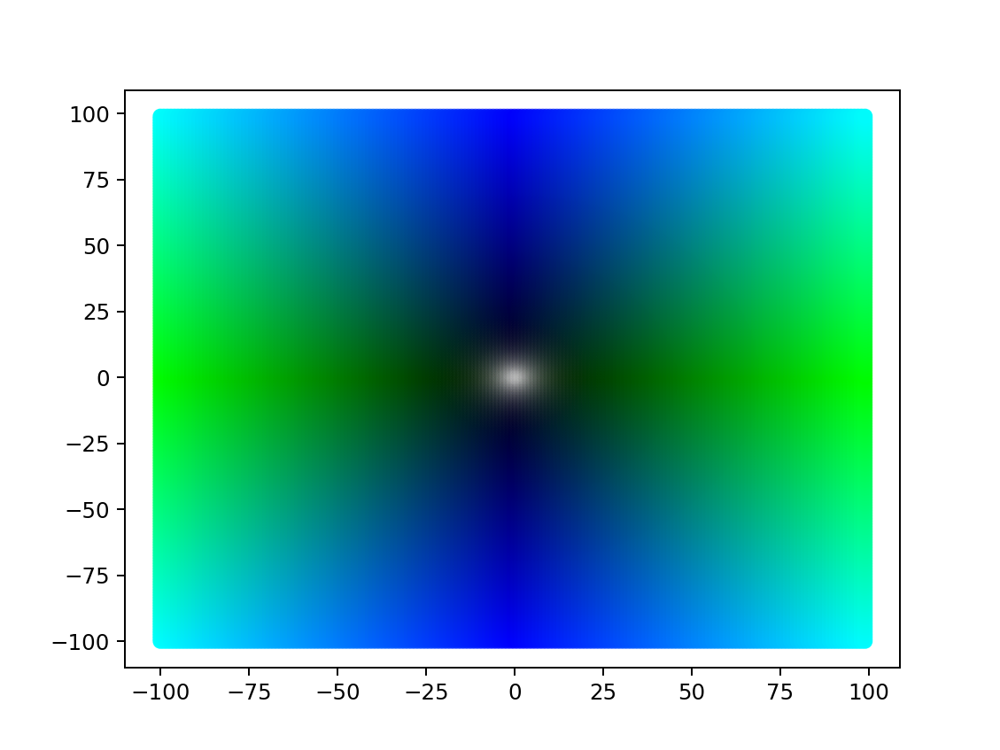

<IPython.core.display.Javascript object>


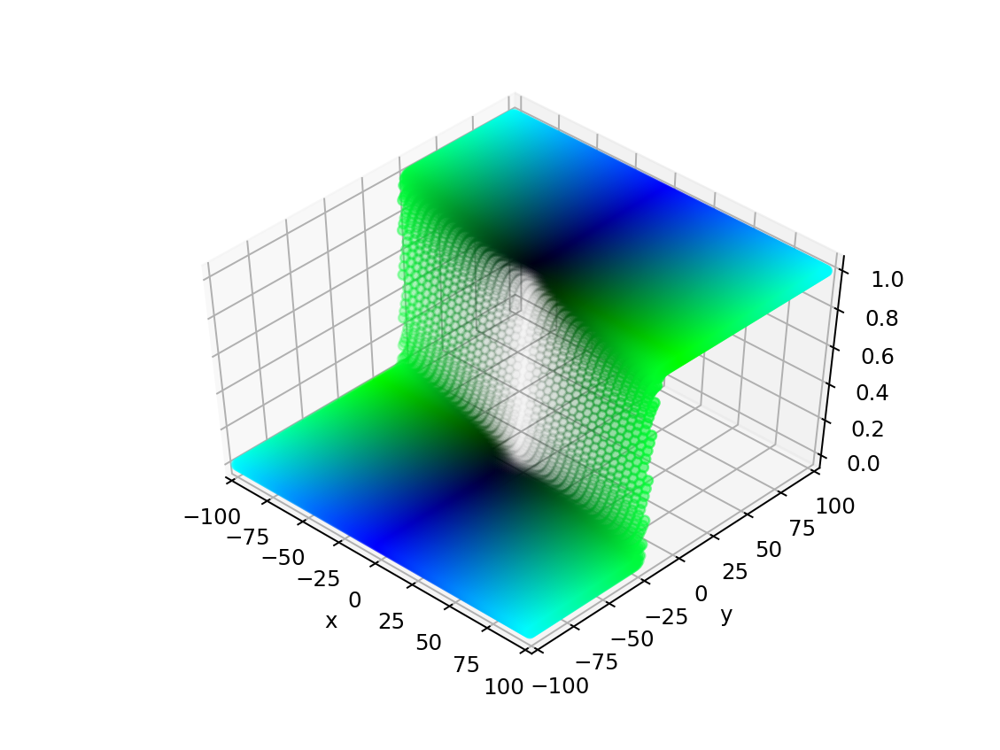

<IPython.core.display.Javascript object>


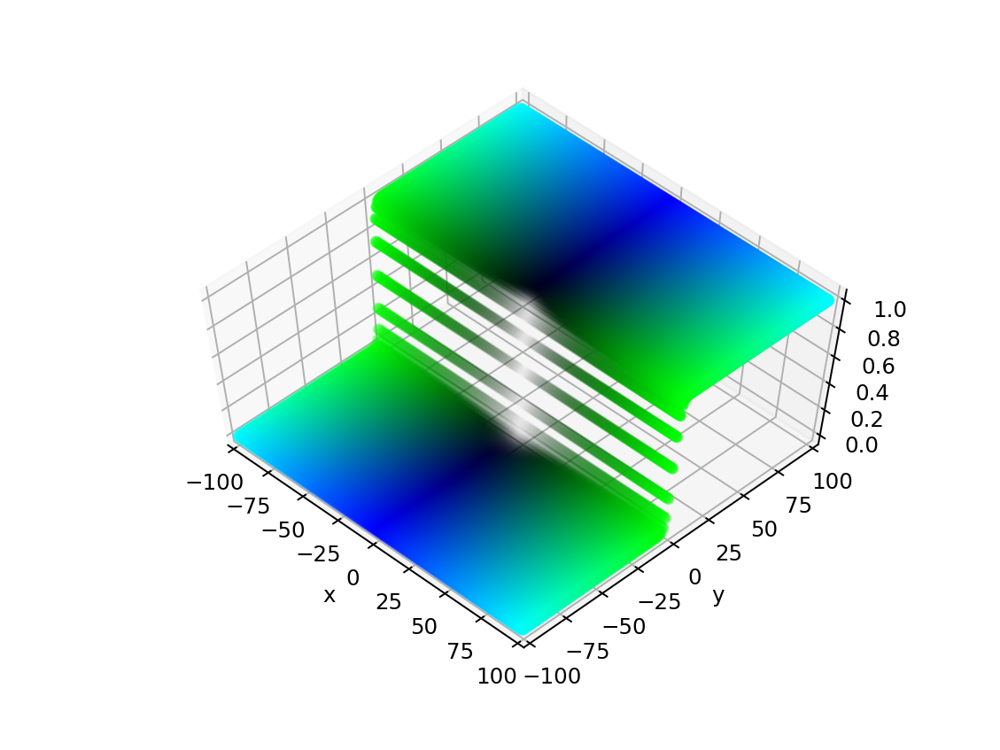

<IPython.core.display.Javascript object>


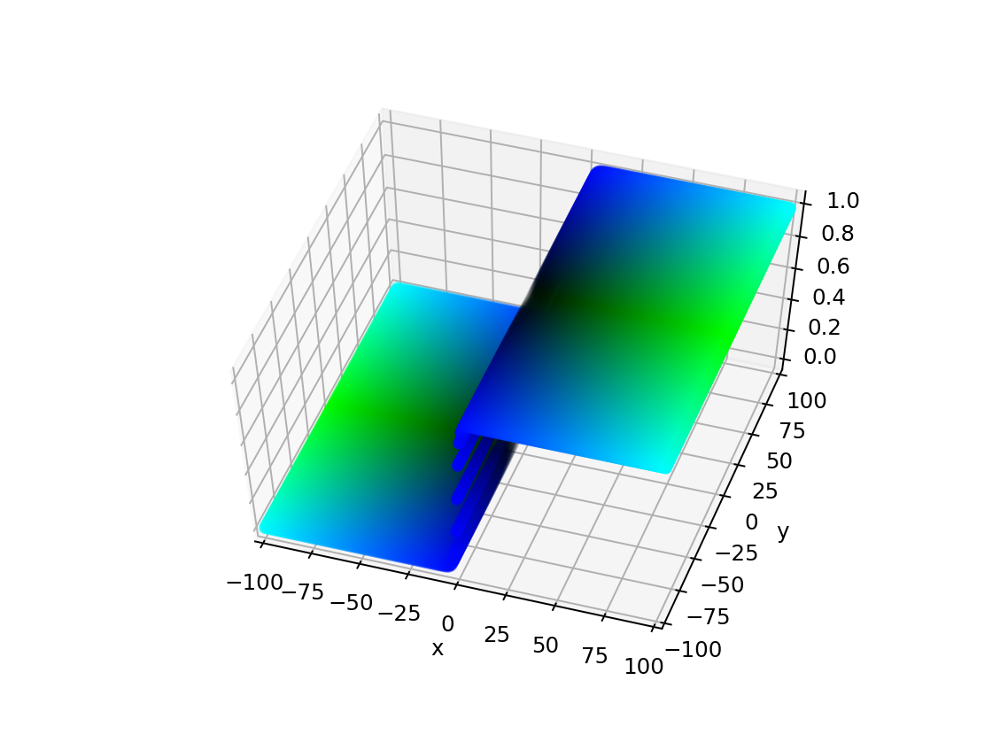

In [11]:
from scipy.special import expit #sigmoid function

plt.scatter(df["x"], df["y"], c=df["RGBA"])

def f(Ax, Ay, activation="sigmoid"):
    def sigmoid(row):
        return expit(row["x"]*Ax + row["y"]*Ay)
    
    df["sigmoid"] = df.apply(sigmoid, axis=1)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(df["x"], df["y"], df["sigmoid"], c=df["RGBA"])
    plt.xlim(-100, 100)
    plt.ylim(-100, 100)
    plt.xlabel("x")
    plt.ylabel("y")
    
# interact(f, x_skew=1, y_skew=1)
f(Ax=0.2, Ay=1)
f(Ax=0, Ay=1)
f(Ax=1, Ay=0)
# f(Ax=0.5, Ay=1)
# f(Ax=0.1, Ay=10)

<IPython.core.display.Javascript object>


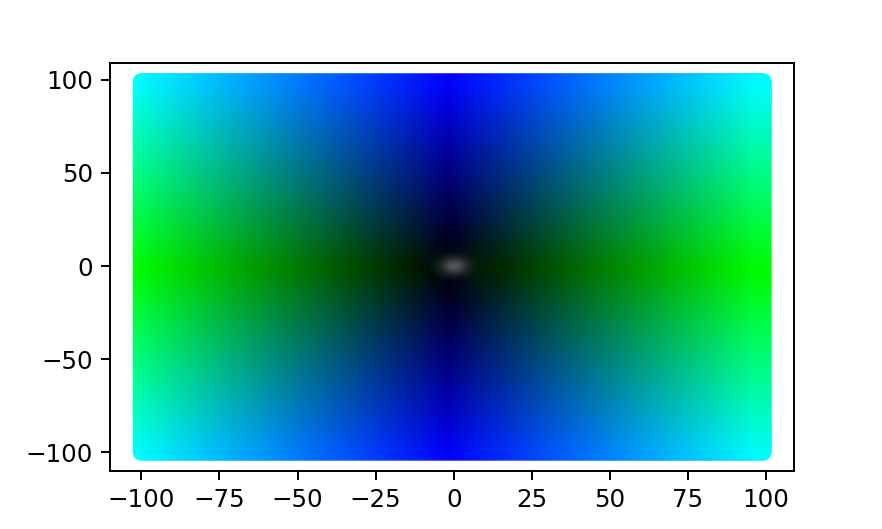

<IPython.core.display.Javascript object>


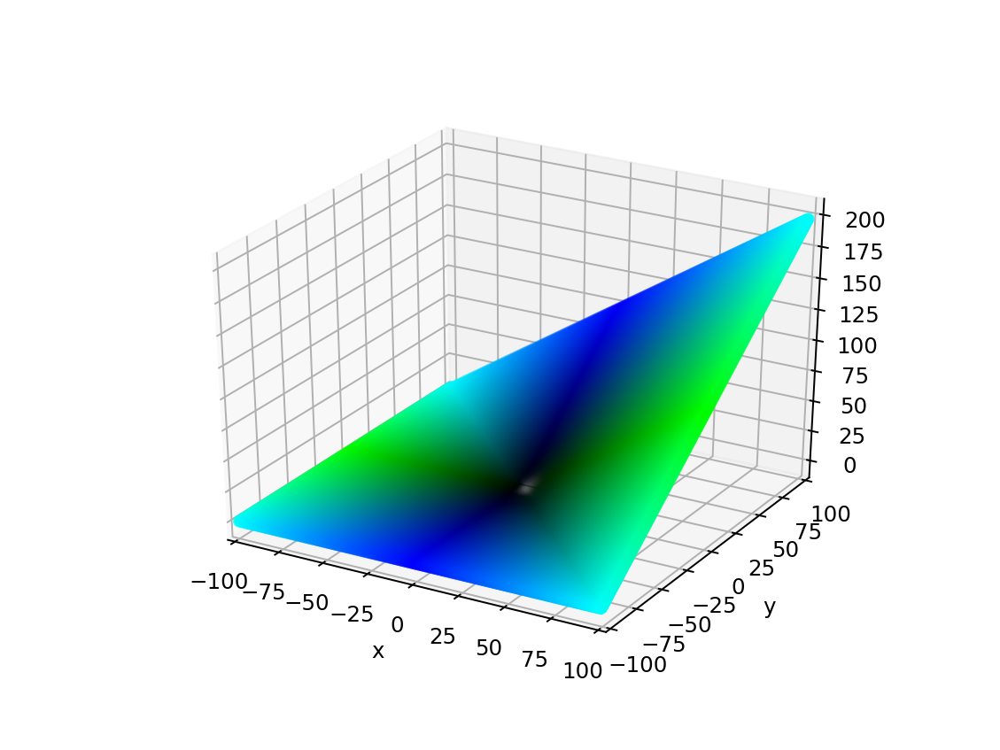

<IPython.core.display.Javascript object>


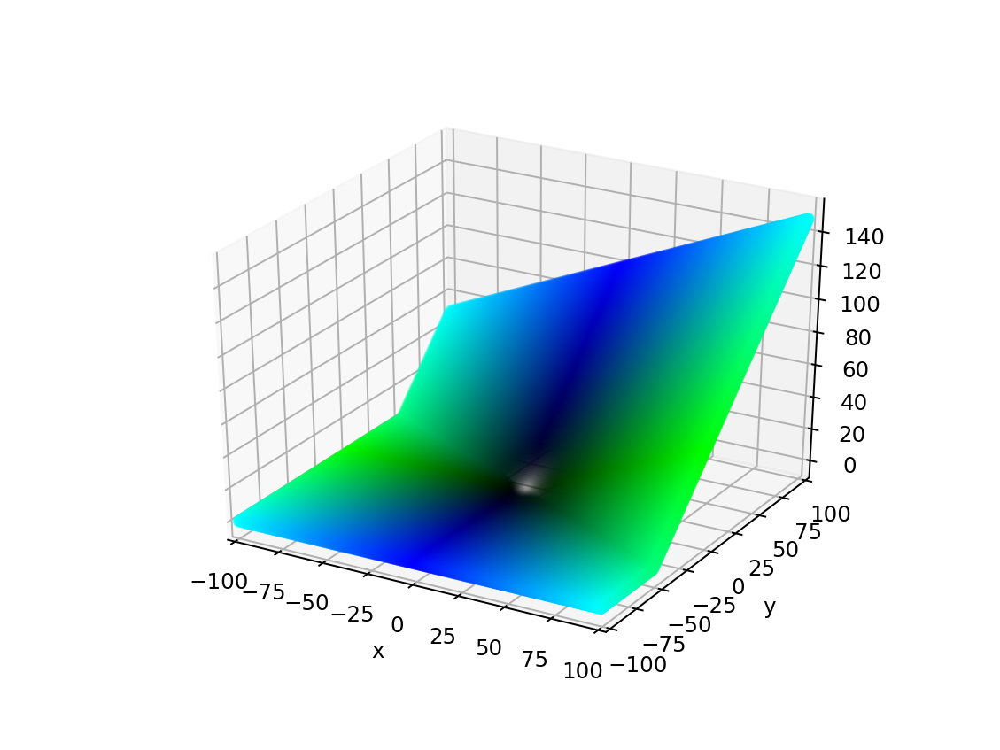

<IPython.core.display.Javascript object>


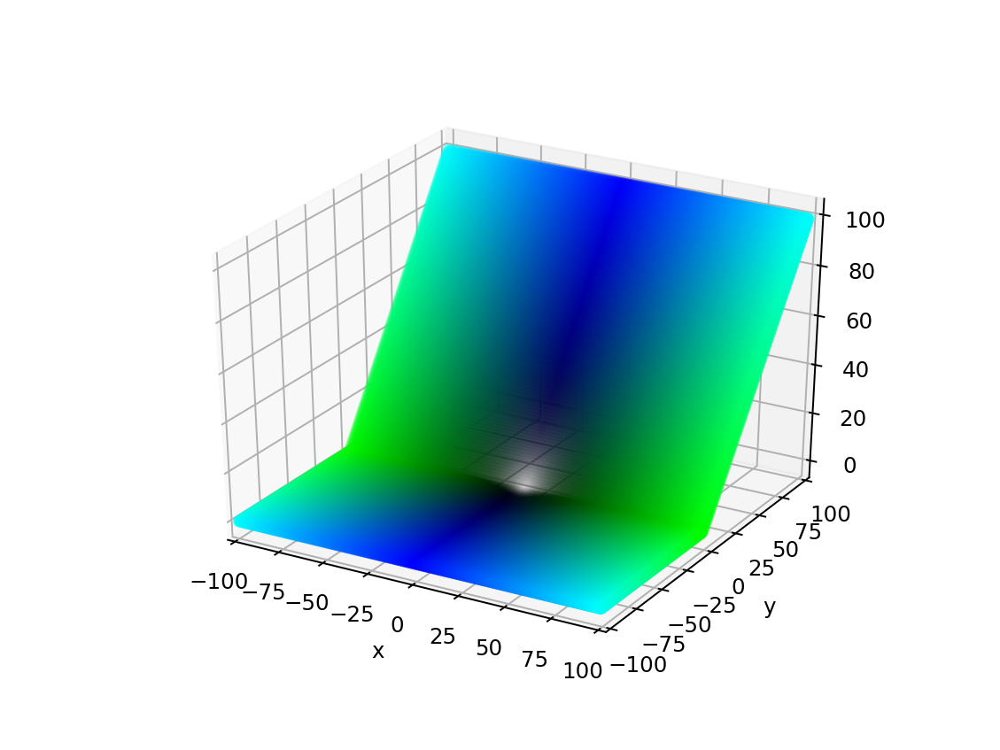

<IPython.core.display.Javascript object>


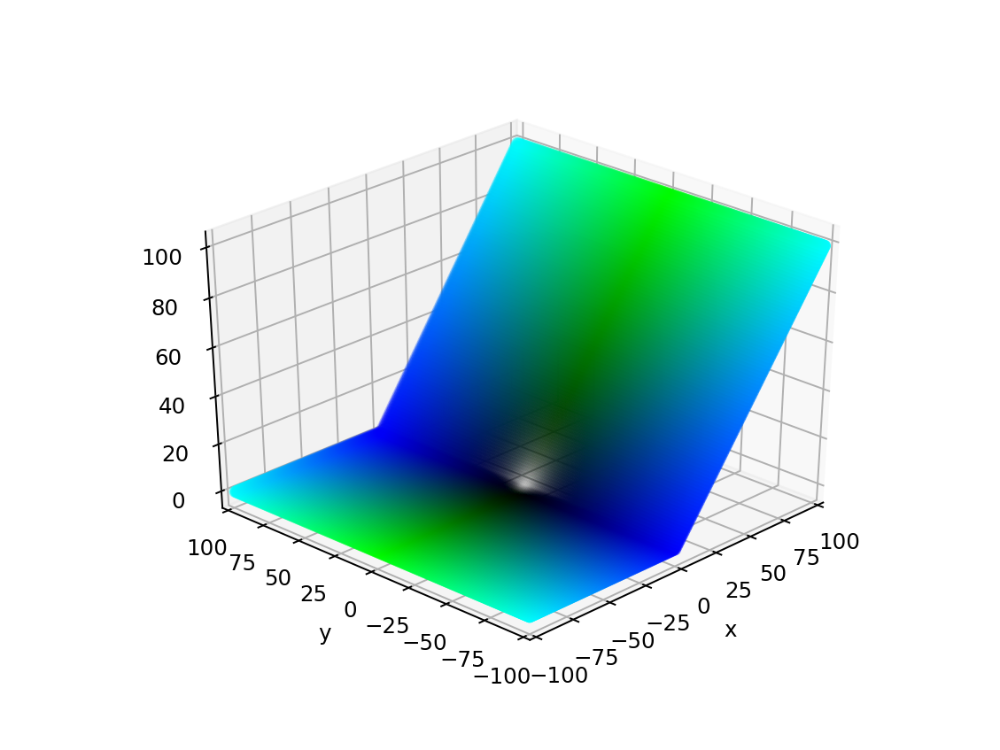

In [15]:
plt.figure(figsize=(5,3))
plt.scatter(df["x"], df["y"], c=df["RGBA"])

def f(Ax, Ay, activation="ReLu"):
    def relu(row):
        return max(0, row["x"]*Ax + row["y"]*Ay)
    
    df["ReLu"] = df.apply(relu, axis=1)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(df["x"], df["y"], df["ReLu"], c=df["RGBA"])
    plt.xlim(-100, 100)
    plt.ylim(-100, 100)
    plt.xlabel("x")
    plt.ylabel("y")
    
# interact(f, x_skew=1, y_skew=1)
f(Ax=1, Ay=1)
f(Ax=0.5, Ay=1)
f(Ax=0, Ay=1)
f(Ax=1, Ay=0)

### Softmax

<IPython.core.display.Javascript object>


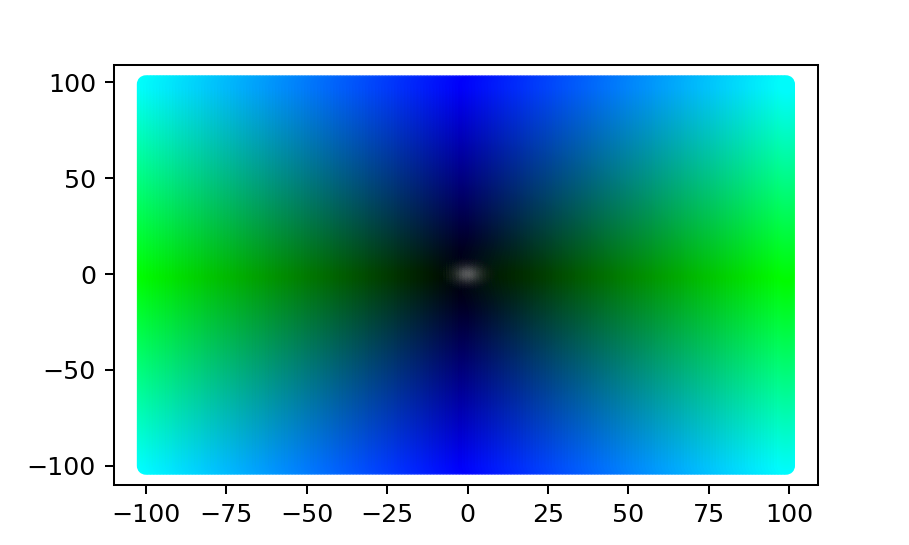

<IPython.core.display.Javascript object>


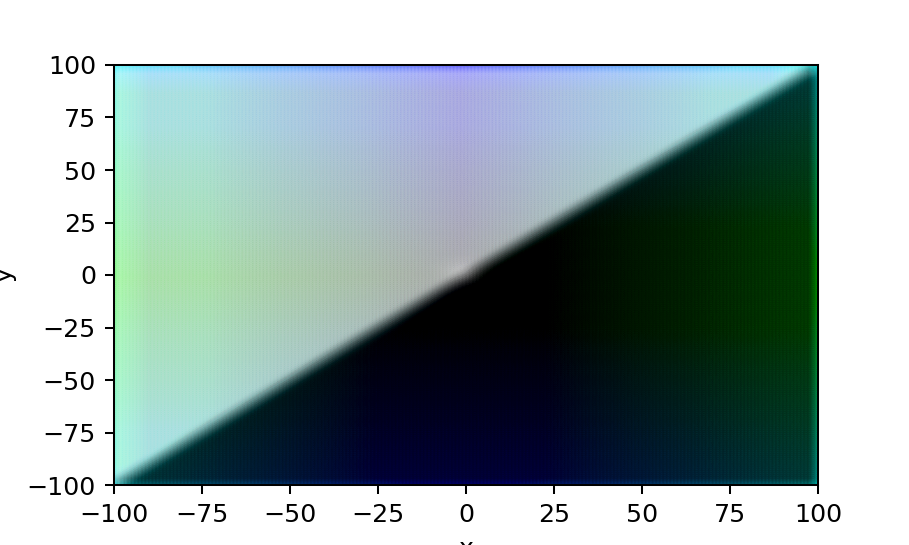

In [35]:
from scipy.special import softmax

fig = plt.figure(figsize=(5,3))
plt.scatter(df["x"], df["y"], c=df["RGBA"])

def f(Ax, Ay, activation="softmax"):
    def _softmax(row):
        return softmax([row["x"]*Ax, row["y"]*Ay])[0]
    
    df["softmax"] = df.apply(_softmax, axis=1)
    fig = plt.figure(figsize=(5,3))
    plt.scatter(df["x"], df["y"], c=df["RGBA"])
    plt.scatter(df["x"], df["y"], c=df["softmax"], cmap="Greys", alpha=0.03)
    plt.xlim(-100, 100)
    plt.ylim(-100, 100)
    plt.xlabel("x")
    plt.ylabel("y")
    
# interact(f, x_skew=1, y_skew=1)
f(Ax=1, Ay=1)
# f(Ax=0.5, Ay=1)

In [29]:
df["relu_1"] = df.apply(lambda row: max(0, row["x"]*0 + row["y"]*1) , axis=1)
df["relu_2"] = df.apply(lambda row: max(0, row["x"]*1 + row["y"]*0) , axis=1)

<IPython.core.display.Javascript object>


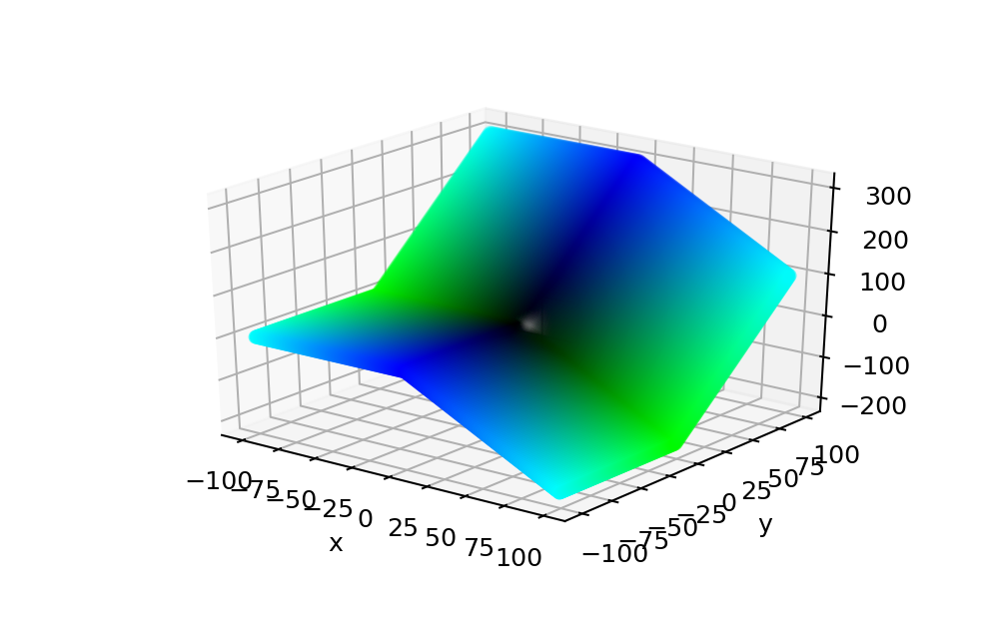

Text(0.5, 0, 'y')

In [67]:
relu_1 = 3
relu_2 = -2

fig = plt.figure(figsize=(5,3))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df["x"], df["y"], relu_1*df["relu_1"]+relu_2*df["relu_2"], c=df["RGBA"])
plt.xlabel("x")
plt.ylabel("y")

<IPython.core.display.Javascript object>


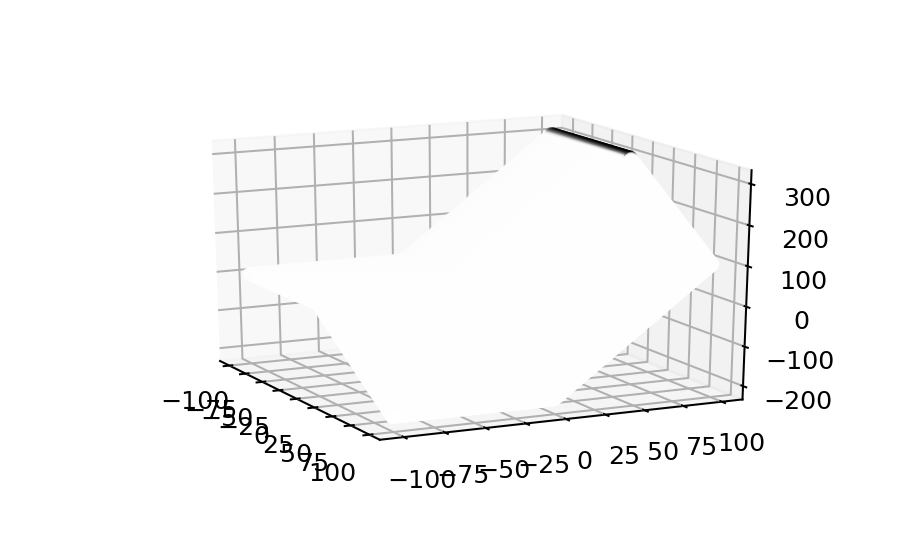

In [68]:
fig = plt.figure(figsize=(5,3))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df["x"], df["y"], relu_1*df["relu_1"]+relu_2*df["relu_2"], c=softmax([relu_1*df["relu_1"].values+relu_2*df["relu_2"].values])[0], cmap="Greys")